<a href="https://colab.research.google.com/github/DJCordhose/mlops-drift/blob/main/notebooks/4-analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analyzing drift

In [1]:
import sys
IN_COLAB = 'google.colab' in sys.modules
IN_COLAB

True

In [2]:
def url_for_dataset(relative_path):
  if IN_COLAB:
    url = f'https://github.com/DJCordhose/mlops-drift/raw/main/datasets/insurance_prediction/{relative_path}.csv.gz'
  else:
    url =  f'../datasets/insurance_prediction/{relative_path}.csv.gz'
  return url

In [3]:
import numpy as np
np.__version__

'1.23.5'

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (20, 8)
mpl.rcParams['axes.titlesize'] = 24
mpl.rcParams['axes.labelsize'] = 16

# Step 1: Looking at data using standard tools

**caution, this presumes we have ground truth (which we may not have)**

In [5]:
# how many months after training?
iteration = 36 # final month in dataset, should have the biggest difference
# iteration = 12 # one year later, drift should start to show

In [6]:
import pandas as pd

df_iteration = pd.read_csv(url_for_dataset(f'monthly/month-{iteration}'), delimiter=';')

In [7]:
df_iteration.columns

Index(['training', 'age', 'emergency_braking', 'braking_distance', 'power',
       'miles', 'risk', 'group_name', 'group'],
      dtype='object')

In [8]:
df_iteration.head()

,training,age,emergency_braking,braking_distance,power,miles,risk,group_name,group
0,0,45.700860,1,33.730669,118.306787,92.429050,-0.813517,low,2
1,0,53.091268,1,35.575746,168.151487,53.595707,0.226851,low,2
2,1,41.989477,1,37.515860,104.683894,40.402020,-1.406092,low,2
3,0,41.792728,1,44.043184,143.531543,46.462029,0.667405,low,2
4,1,28.679302,1,34.329172,85.439495,39.791829,-1.693063,low,2


In [9]:
df_iteration.describe()

,training,age,emergency_braking,braking_distance,power,miles,risk,group
count,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000
mean,0.180667,39.438736,0.938667,40.051490,135.215854,62.765366,0.530821,1.622000
std,0.384870,13.261725,0.240021,5.072253,35.950635,25.582015,1.301681,0.539732
min,0.000000,19.786403,0.000000,22.509900,26.938595,5.000000,-3.828745,0.000000
25%,0.000000,28.474238,1.000000,36.687131,109.462877,43.222911,-0.381861,1.000000
50%,0.000000,36.935743,1.000000,40.342817,132.244743,58.121909,0.519117,2.000000
75%,0.000000,47.503926,1.000000,43.311050,155.987021,79.320875,1.392502,2.000000
max,1.000000,96.931120,1.000000,57.967082,284.698999,175.221602,5.530662,2.000000


## Compare to reference data
* be careful, we probably do not have the ground truth
* look at means first

In [10]:
df_reference = pd.read_csv(url_for_dataset(f'reference'), delimiter=';')
df_reference.describe()

,training,age,emergency_braking,braking_distance,power,miles,risk,group
count,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000
mean,0.210000,35.146663,0.394000,39.903294,134.888089,80.965668,2.183617,0.901333
std,0.407444,12.765348,0.488798,4.781834,35.048570,25.496752,2.481164,0.815705
min,0.000000,15.949545,0.000000,24.368993,38.246253,18.796953,-5.289352,0.000000
25%,0.000000,25.141921,0.000000,36.733165,110.008660,62.666195,0.708085,0.000000
50%,0.000000,32.714683,0.000000,39.867888,131.055019,77.094819,2.386835,1.000000
75%,0.000000,42.633629,1.000000,42.938777,157.319959,95.568682,3.874869,2.000000
max,1.000000,86.213394,1.000000,56.463472,285.750164,211.807417,10.343054,2.000000


# Observations

*  mean of age, miles, emergency_braking clearly shifted

# More manual inspections

In [11]:
import seaborn as sns
sns.__version__

'0.12.2'

In [12]:
labels = ["High Risk", "Medium Risk", "Low Risk"]
markers = ['v', 'd', '^']
# colors = ['#FF8080', '#FFFF80', '#8080FF']
colors = ['#FF0000', '#FFFF00', '#0000FF']

In [13]:
features = ['training', 'age', 'emergency_braking', 'braking_distance', 'power', 'miles', 'risk']

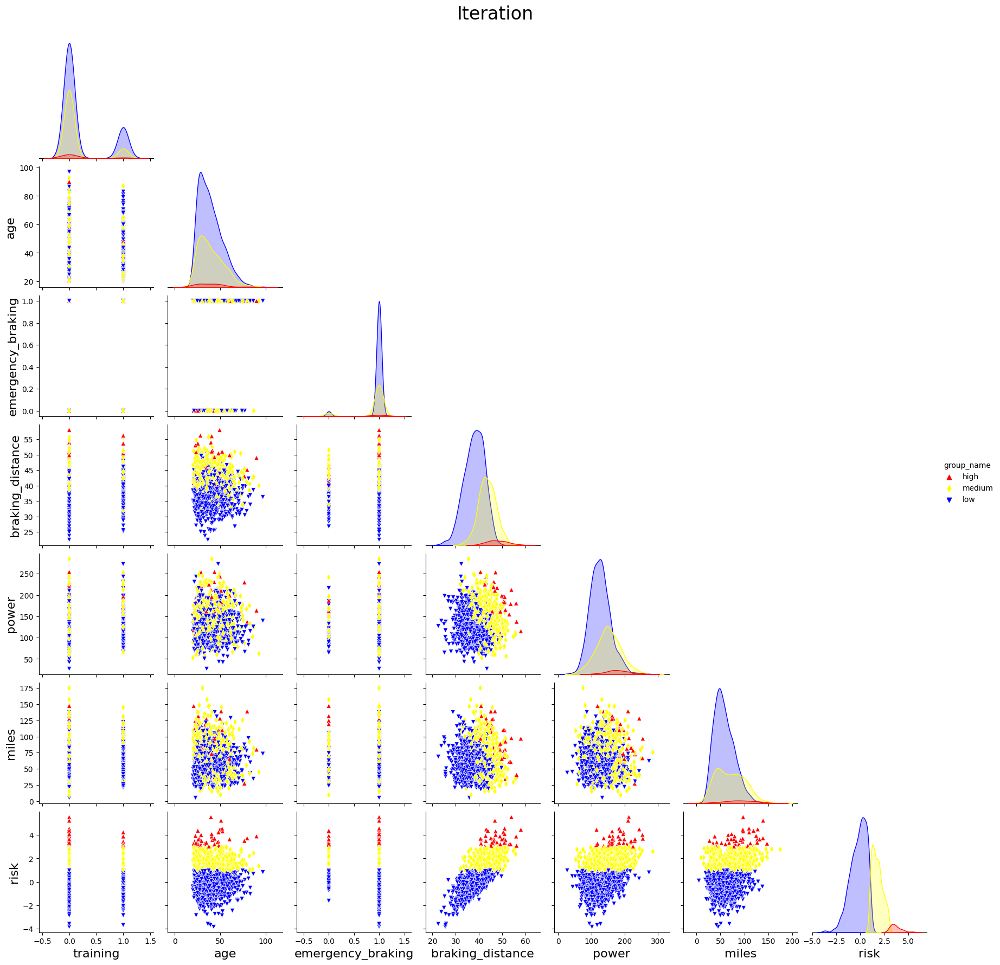

In [14]:
sns.pairplot(df_iteration,
             kind="scatter",
             diag_kind="kde",
             corner=True,
             hue='group_name',
             hue_order = ['high', 'medium', 'low'],
             palette=colors,
             markers=markers,
             vars=features)

plt.suptitle("Iteration", y=1.02, fontsize=24);

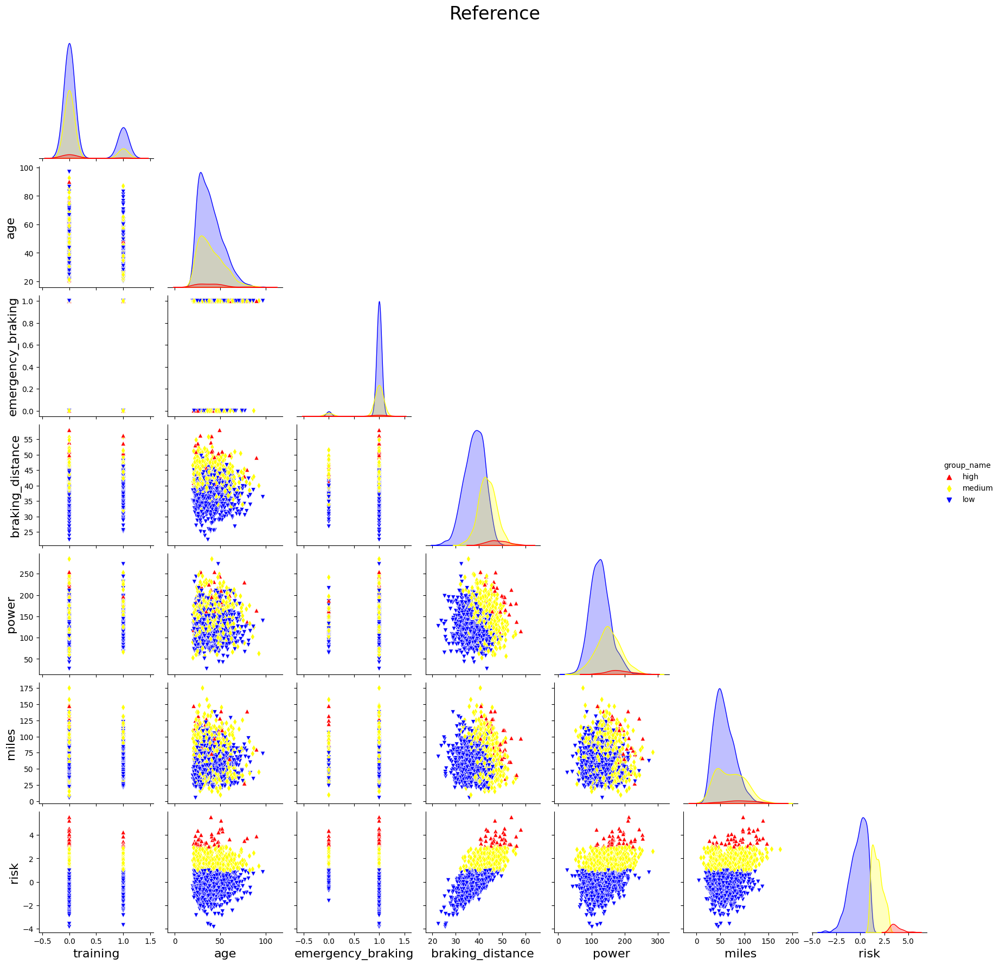

In [15]:
sns.pairplot(df_iteration,
             kind="scatter",
             diag_kind="kde",
             corner=True,
             hue='group_name',
             hue_order = ['high', 'medium', 'low'],
             palette=colors,
             markers=markers,
             vars=features)

plt.suptitle("Reference", y=1.02, fontsize=24);

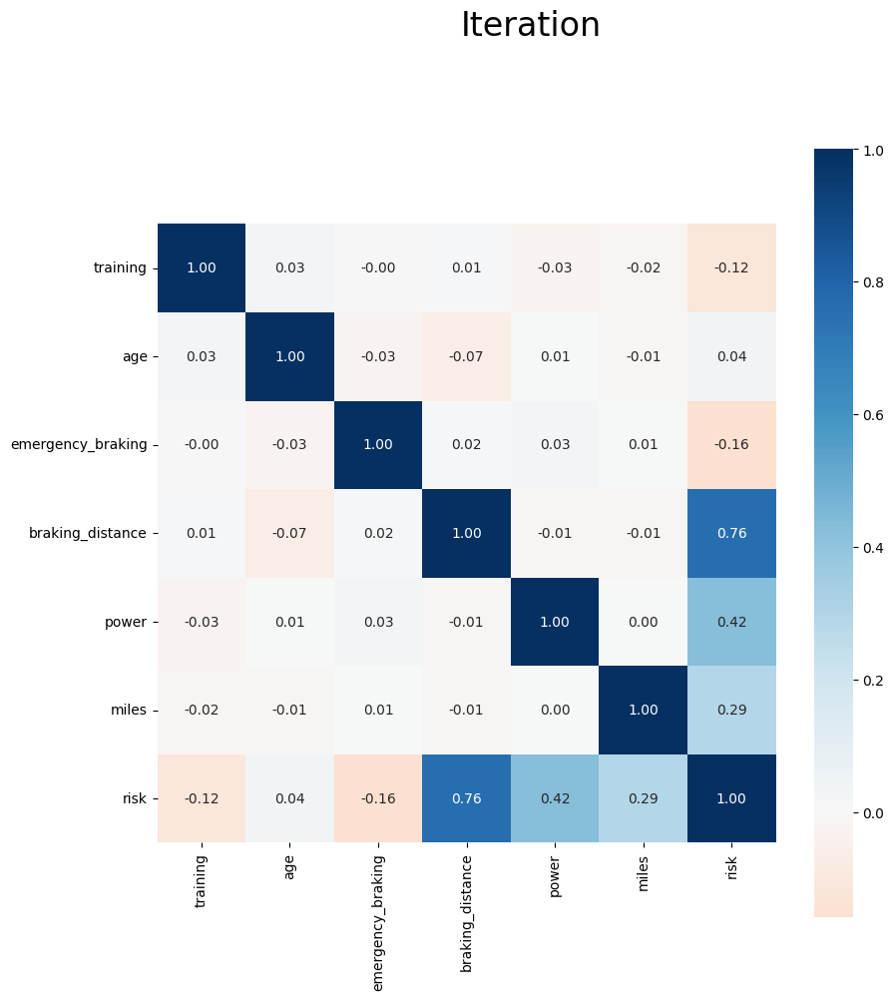

In [16]:
plt.figure(figsize=(10, 10))

df_corr = df_iteration.drop(columns=["group", "group_name"])

cm = df_corr.corr()

hm = sns.heatmap(cm,
                cbar=True,
                annot=True,
                square=True,
                cmap='RdBu',
                center=0,
                fmt='.2f',
                yticklabels=features,
                xticklabels=features)

plt.suptitle("Iteration", y=1.02, fontsize=24);

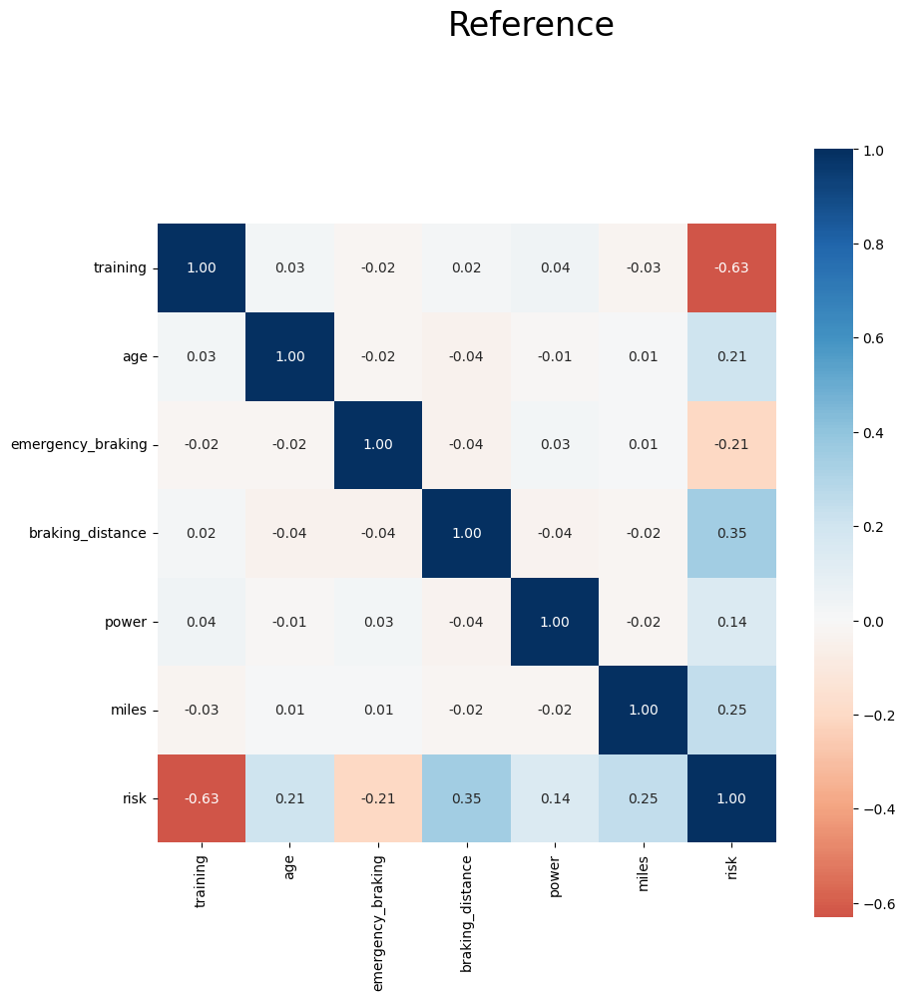

In [ ]:
plt.figure(figsize=(10, 10))

df_corr = df_reference.drop(columns=["group", "group_name"])

cm = df_corr.corr()

hm = sns.heatmap(cm,
                cbar=True,
                annot=True,
                square=True,
                cmap='RdBu',
                center=0,
                fmt='.2f',
                yticklabels=features,
                xticklabels=features)

plt.suptitle("Reference", y=1.02, fontsize=24);

# Observations

**again, be careful, we might not have ground truth**

* influence of age and training clearly down
* influence of braking distance and power clearly up

In [ ]:
if IN_COLAB:
  !pip install -q evidently

In [ ]:
import evidently
evidently.__version__

# Step 2: Analyze for drift of input data

__this time without using any ground truth__

https://www.evidentlyai.com/blog/mlops-monitoring

In [ ]:
df_iteration_X = df_iteration.drop(['risk', 'group', 'group_name'], axis='columns')
df_reference_X = df_reference.drop(['risk', 'group', 'group_name'], axis='columns')

In [29]:
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset

report = Report(metrics=[
   DataDriftPreset(),
])

report.run(reference_data=df_reference_X, current_data=df_iteration_X)
report

## Looking a bit more closely into drifted features  

In [30]:
from evidently.metrics import ColumnDriftMetric
from evidently.metrics import ColumnSummaryMetric
from evidently.metrics import DatasetDriftMetric
from evidently.metrics import DatasetMissingValuesMetric
from evidently.metrics import RegressionPredictedVsActualPlot

from evidently.metrics import ColumnValuePlot

from evidently.report import Report
from evidently.test_preset import DataDriftTestPreset
from evidently.test_suite import TestSuite
from evidently.ui.dashboards import CounterAgg
from evidently.ui.dashboards import DashboardPanelCounter
from evidently.ui.dashboards import DashboardPanelPlot
from evidently.ui.dashboards import PanelValue
from evidently.ui.dashboards import PlotType
from evidently.ui.dashboards import ReportFilter

report = Report(
        metrics=[
            # general inforamtion
            # DatasetDriftMetric(),
            # DatasetMissingValuesMetric(),

            ColumnDriftMetric(column_name="age", stattest="wasserstein"),
            ColumnSummaryMetric(column_name="age"),
            ColumnValuePlot(column_name="age"),

            ColumnDriftMetric(column_name="miles", stattest="wasserstein"),
            ColumnSummaryMetric(column_name="miles"),
            ColumnValuePlot(column_name="miles"),

            ColumnDriftMetric(column_name="emergency_braking", stattest="jensenshannon"),
            # both not very speaking for binary parameter
            # ColumnSummaryMetric(column_name="emergency_braking"),
            # ColumnValuePlot(column_name="emergency_braking"),
        ],
        options={"render": {"raw_data": True}}
)

report.run(reference_data=df_reference_X, current_data=df_iteration_X)
report

# Step 3: Using predictions of model
**supposing we have no ground truth**

https://docs.evidentlyai.com/presets/target-drift

In [ ]:
import tensorflow as tf
tf.__version__

In [ ]:
if IN_COLAB:
  !wget https://github.com/DJCordhose/mlops-drift/raw/main/notebooks/classifier.h5
model_path = 'classifier'

In [ ]:
model = tf.keras.models.load_model(f'{model_path}.h5')

In [ ]:
X = df_iteration_X
y_pred = model.predict(X, verbose=0).argmax(axis=1)
df_prediction = X.copy()
df_prediction['pred'] = y_pred
df_reference.head()

In [ ]:
X = df_reference_X
y_pred = model.predict(X, verbose=0).argmax(axis=1)
df_reference_prediction = X.copy()
df_reference_prediction['pred'] = y_pred
df_reference_prediction.head()

In [31]:
# https://docs.evidentlyai.com/user-guide/input-data/column-mapping
from evidently import ColumnMapping
# https://docs.evidentlyai.com/presets/target-drift
from evidently.metric_preset import TargetDriftPreset

target_drift_report = Report(metrics=[
    TargetDriftPreset(),
])
column_mapping = ColumnMapping()

column_mapping.prediction = 'pred'
column_mapping.task = 'classification'
# useless as we have no way of specifying correlation between numerical and categorical
# column_mapping.numerical_features = ['age', 'braking_distance', 'power', 'miles']
# will use Cramer's V correlation (https://en.wikipedia.org/wiki/Cram%C3%A9r%27s_V)
column_mapping.categorical_features = ['training', 'emergency_braking' ]

target_drift_report.run(reference_data=df_reference_prediction, current_data=df_prediction, column_mapping=column_mapping)
target_drift_report

# Observations

* less bad drivers
* more good drivers
* younger drivers significantly better
* worse braking distance makes worse drivers
* training of driver has far less impact
* most cars have improved safety devices
